In [13]:
pip install opencv-python

  Obtaining dependency information for opencv-python from https://files.pythonhosted.org/packages/ec/6c/fab8113424af5049f85717e8e527ca3773299a3c6b02506e66436e19874f/opencv_python-4.10.0.84-cp37-abi3-win_amd64.whl.metadata
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB 653.6 kB/s eta 0:01:00
   ---------------------------------------- 0.1/38.8 MB 930.9 kB/s eta 0:00:42
   ---------------------------------------- 0.2/38.8 MB 1.1 MB/s eta 0:00:37
   ---------------------------------------- 0.3/38.8 MB 1.5 MB/s eta 0:00:27
   ---------------------------------------- 0.5/38.8 MB 1.8 MB/s eta 0:00:22
    --------------------------------------- 0.6/38.8 MB 2.0 MB/s eta 0:00:19
    --------------------------------------- 0.7/38.8 MB 2.2 MB/s eta 0:00:18
    --------------------------------------- 0.7/38.8 MB 2.2 MB/s eta 0:00:18
    --------------

In [14]:
pip install opencv-contrib-python

  Obtaining dependency information for opencv-contrib-python from https://files.pythonhosted.org/packages/a7/9e/7110d2c5d543ab03b9581dbb1f8e2429863e44e0c9b4960b766f230c1279/opencv_contrib_python-4.10.0.84-cp37-abi3-win_amd64.whl.metadata
   ---------------------------------------- 0.0/45.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.5 MB 495.5 kB/s eta 0:01:32
   ---------------------------------------- 0.1/45.5 MB 939.4 kB/s eta 0:00:49
   ---------------------------------------- 0.2/45.5 MB 1.2 MB/s eta 0:00:39
   ---------------------------------------- 0.3/45.5 MB 1.6 MB/s eta 0:00:29
   ---------------------------------------- 0.5/45.5 MB 1.8 MB/s eta 0:00:25
    --------------------------------------- 0.6/45.5 MB 2.0 MB/s eta 0:00:23
    --------------------------------------- 0.6/45.5 MB 2.0 MB/s eta 0:00:23
    --------------------------------------- 0.7/45.5 MB 1.7 MB/s eta 0:00:27
  

In [1]:

import warnings
warnings.filterwarnings("ignore")
# Gerekli kütüphaneleri ekleme
import tensorflow as tf                                                                         
import seaborn as sns    
import matplotlib.pyplot as plt  
from tensorflow import keras     
import numpy as np     
import os              
import pandas as pd    
import itertools       
from tensorflow.keras.utils import image_dataset_from_directory 
from tensorflow.keras.layers import BatchNormalization, Dropout 
from sklearn.metrics import precision_score, accuracy_score, recall_score, confusion_matrix, ConfusionMatrixDisplay 
from tensorflow.keras.preprocessing import image 

In [2]:
train_data = "C:/Users/Bilgehan/Desktop/Sema Tosun/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_data = "C:/Users/Bilgehan/Desktop/Sema Tosun/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# Eğitim ve doğrulama veri kümesini görüntü veri kümesi olarak yükleme

train_gen = image_dataset_from_directory(directory=train_data, image_size=(256, 256))
valid_gen = image_dataset_from_directory(directory=valid_data, image_size=(256, 256))

# Eğitim ve doğrulama veri kümesindeki görüntülerin piksel değerlerini normalleştirme

train_gen = train_gen.map(lambda image, label: (image / 255.0, label))
valid_gen = valid_gen.map(lambda image, label: (image / 255.0, label))

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.


In [4]:
# Get the list of class names by listing directories in the training dataset
class_names = sorted(os.listdir("C:/Users/Bilgehan/Desktop/Sema Tosun/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"))
# Print the total number of classes
print(f'The total number of classes is: {len(class_names)}')

# Iterate through the class names and print each one
for class_name in class_names:
    print(class_name)

The total number of classes is: 38
Apple___Apple_scab
Apple___Black_rot
Apple___Cedar_apple_rust
Apple___healthy
Blueberry___healthy
Cherry_(including_sour)___Powdery_mildew
Cherry_(including_sour)___healthy
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn_(maize)___Common_rust_
Corn_(maize)___Northern_Leaf_Blight
Corn_(maize)___healthy
Grape___Black_rot
Grape___Esca_(Black_Measles)
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Grape___healthy
Orange___Haunglongbing_(Citrus_greening)
Peach___Bacterial_spot
Peach___healthy
Pepper,_bell___Bacterial_spot
Pepper,_bell___healthy
Potato___Early_blight
Potato___Late_blight
Potato___healthy
Raspberry___healthy
Soybean___healthy
Squash___Powdery_mildew
Strawberry___Leaf_scorch
Strawberry___healthy
Tomato___Bacterial_spot
Tomato___Early_blight
Tomato___Late_blight
Tomato___Leaf_Mold
Tomato___Septoria_leaf_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Target_Spot
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Tomato___Tomato_mosaic_viru

In [5]:
# Identify unique plants and count the number of diseases ^_^

# Get the list of diseases by listing directories in the training data
diseases = os.listdir(train_data)
# Initialize lists to store unique plants and count the number of diseases
plants = []
NumberOfDiseases = 0

# Iterate through each disease
for plant in diseases:
    # Check if the plant name is not already in the list of unique plants
    if plant.split('_')[0] not in plants:
        # Add the unique plant name to the list
        plants.append(plant.split('_')[0])
    # Check if the disease is not labeled as 'healthy'
    if plant.split('_')[1] != 'healthy':
        # Increment the count of diseases
        NumberOfDiseases += 1

# Print the number of unique plants in the dataset
print("Number of plants: {}".format(len(plants)))
print('-'*50)
print(f"Unique Plants are: \n{plants}")
print()

# Print the number of unique diseases (excluding 'healthy')
print("Number of unique diseases (without healthy): {}".format(NumberOfDiseases))
print('-'*50)
print(f"Unique Plants are: \n{diseases}")

Number of plants: 14
--------------------------------------------------
Unique Plants are: 
['Apple', 'Blueberry', 'Cherry', 'Corn', 'Grape', 'Orange', 'Peach', 'Pepper,', 'Potato', 'Raspberry', 'Soybean', 'Squash', 'Strawberry', 'Tomato']

Number of unique diseases (without healthy): 38
--------------------------------------------------
Unique Plants are: 
['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Pot

In [9]:

nums_train = {}                                                 #Boş Sözlükler Oluşturma
nums_valid = {}                                                 #Boş Sözlükler Oluşturma

# Hastalıklar listesindeki her hastalığın üzerinde döndürme
for disease in diseases:
    #Eğitim ve doğrulama veri kümesindeki mevcut hastalığa ait görüntülerin sayısını sayma ve saklama
    nums_train[disease] = len(os.listdir(train_data+'/'+disease))
    nums_valid[disease] = len(os.listdir(valid_data+'/'+disease))

# Eğitim ve doğrulama veri kümelerindeki her hastalık için görüntü sayısını görüntülemek için pandas DataFrames oluşturma
image_class_count_train = pd.DataFrame(nums_train.values(), index=nums_train.keys(), columns=['No. of images'])
image_class_count_valid = pd.DataFrame(nums_valid.values(), index=nums_valid.keys(), columns=['No. of images'])

Training data images count per class : 
                                                    No. of images
Apple___Apple_scab                                           2016
Apple___Black_rot                                            1987
Apple___Cedar_apple_rust                                     1760
Apple___healthy                                              2008
Blueberry___healthy                                          1816
Cherry_(including_sour)___healthy                            1826
Cherry_(including_sour)___Powdery_mildew                     1683
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot           1642
Corn_(maize)___Common_rust_                                  1907
Corn_(maize)___healthy                                       1859
Corn_(maize)___Northern_Leaf_Blight                          1908
Grape___Black_rot                                            1888
Grape___Esca_(Black_Measles)                                 1920
Grape___healthy                     

<Axes: title={'center': 'Training data images count per class'}, xlabel='Number of images', ylabel='Classes'>

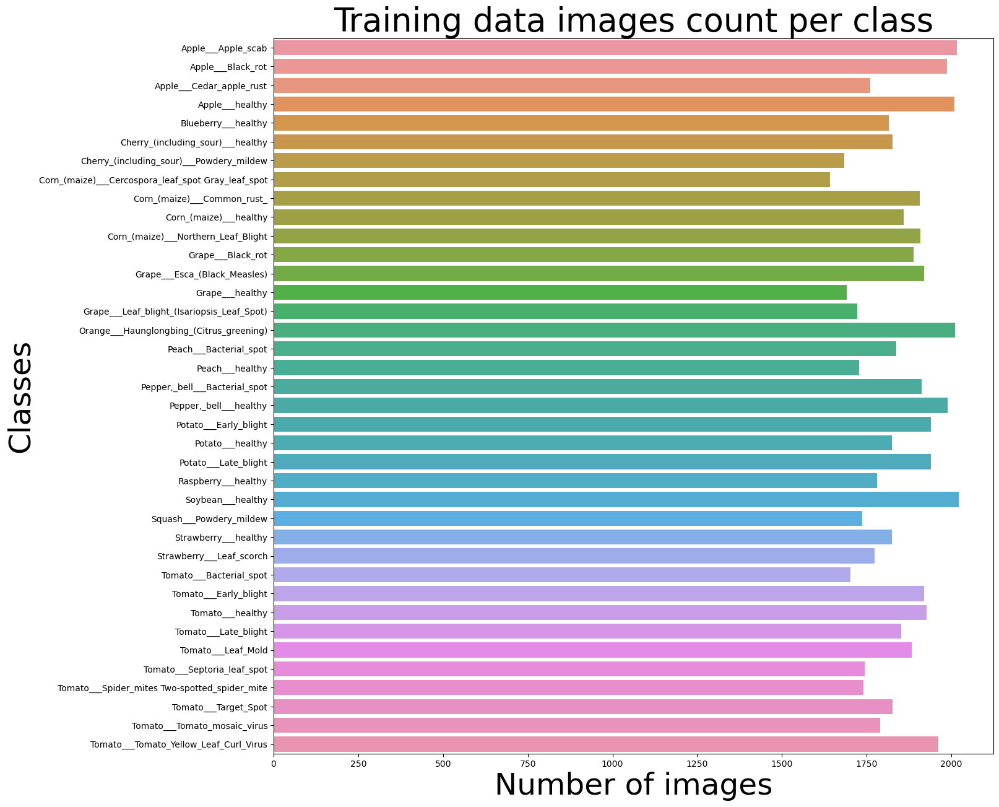

In [10]:
# Sınıf başına eğitim verileri görüntülerinin sayısını yazdırma
print('Training data images count per class : ')
print(image_class_count_train)

# Sınıf başına eğitim görsellerinin sayısını gösteren çubuk grafiği oluşturma
plt.figure(figsize=(15,15))
plt.title("Training data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)

# Anahtarları ve değerleri sözlükten çıkarma
keys = list(nums_train.keys())
vals = list(nums_train.values())

# Seaborn'u kullanarak çubuk grafiğini çizdirme
sns.barplot(y=keys, x=vals)

Validation data images count per class : 
                                                    No. of images
Apple___Apple_scab                                            504
Apple___Black_rot                                             497
Apple___Cedar_apple_rust                                      440
Apple___healthy                                               502
Blueberry___healthy                                           454
Cherry_(including_sour)___healthy                             456
Cherry_(including_sour)___Powdery_mildew                      421
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot            410
Corn_(maize)___Common_rust_                                   477
Corn_(maize)___healthy                                        465
Corn_(maize)___Northern_Leaf_Blight                           477
Grape___Black_rot                                             472
Grape___Esca_(Black_Measles)                                  480
Grape___healthy                   

<Axes: title={'center': 'Validation data images count per class'}, xlabel='Number of images', ylabel='Classes'>

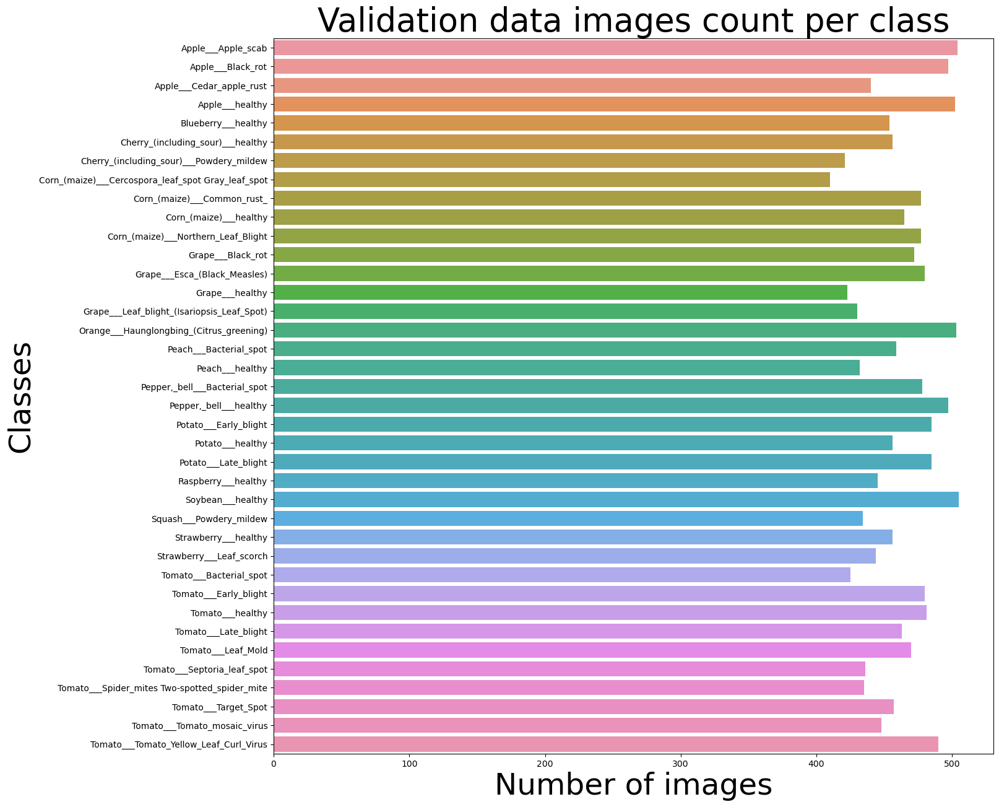

In [11]:
# Sınıf başına doğrulama verisi görüntülerinin sayısını yazdırma
print('Validation data images count per class : ')
print(image_class_count_valid)

# Sınıf başına doğrulama görüntülerinin sayısını gösteren çubuk grafiği oluşturma
plt.figure(figsize=(15,15))
plt.title("Validation data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)

# Anahtarları ve değerleri sözlükten çıkarma
keys = list(nums_valid.keys())
vals = list(nums_valid.values())

# Seaborn'u kullanarak çubuk grafiğini çizdirme
sns.barplot(y=keys, x=vals)

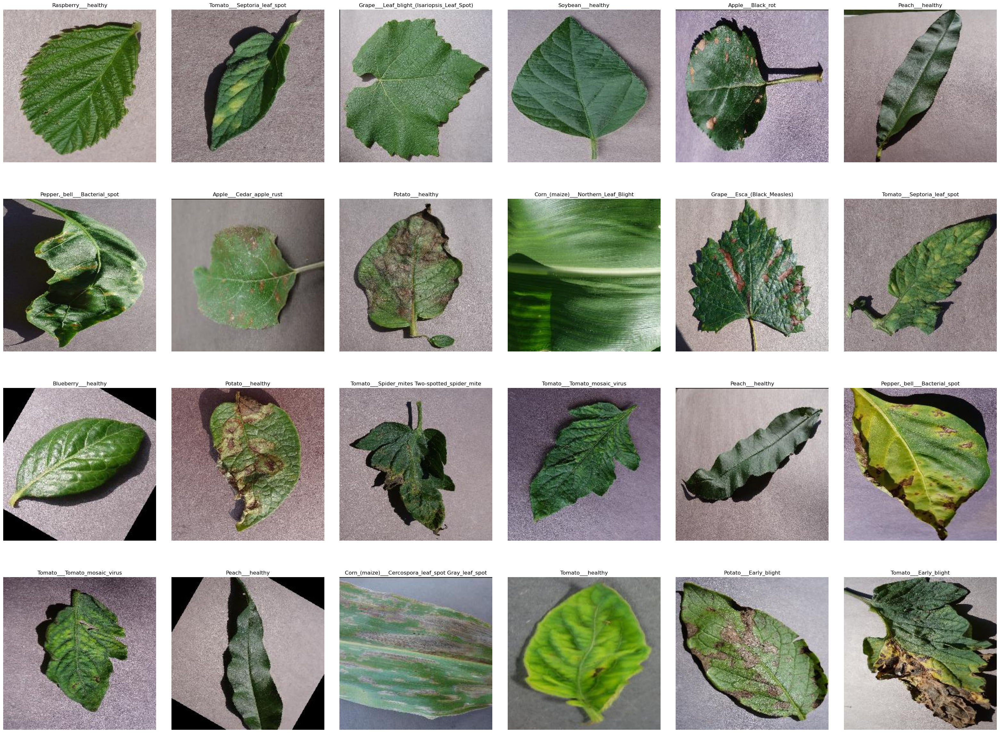

In [16]:
# Görüntüleri Görselleştirme

plt.figure(figsize=(40,30))                                     # Şekil boyutun 40 inç genişlik 30 inç yükseklik
plt.subplots_adjust(wspace=0.1,hspace=0.1)                      # Alt noktalar arasındaki genişlik ve yükseklik aralığı 0,1'e kadar

#24 aralıkta yineleme (24 görüntü görüntülemek için)

for i in range(24):
    #Eğitim verilerindeki mevcut klasörler aralığında rastgele bir klasör dizini al
    random_folder = np.random.randint(0, len(os.listdir(train_data)))
    #Rastgele seçilen klasörün yolunu al
    random_folder_path = os.path.join(train_data, os.listdir(train_data)[random_folder])  
    #Seçili klasördeki mevcut görseller aralığında rastgele bir görsel dizini al
    random_image = np.random.randint(0, len(os.listdir(random_folder_path))) 
    
    #Rastgele seçilen görüntünün yolunu alma ve OpenCV'yi kullanarak görüntüyü okuma
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])  
    image = cv2.imread(random_image_path)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Görüntüyü (BGR'den RGB'ye) dönüştür
    
    #Mevcut görüntünün sınıf adını al
    class_name = class_names[random_folder]  
    
    # 4 satır ve 6 sütundan oluşan bir alt grafik oluşturmave mevcut alt grafik dizinini ayarlama
    plt.subplot(4, 6, i + 1)  
    plt.imshow(image)#Resmi göster
    plt.axis("off")#Ekseni kapat
    plt.title(class_name)#Alt grafiğin başlığını sınıf adına ayarla
    
# Tüm grafiği göster
plt.show()

In [21]:
model = keras.Sequential()

model.add(keras.layers.Conv2D(16,(3,3),activation="relu",padding="same",input_shape=(256,256,3)))
model.add(keras.layers.Conv2D(16,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))
model.add(BatchNormalization())

model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))

model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))
model.add(BatchNormalization())

#model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))
#model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))
#
#model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))
#model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(1568,activation="relu"))
model.add(keras.layers.Dropout(0.5))
model.add(BatchNormalization())
model.add(keras.layers.Dense(38,activation="softmax"))

opt = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt,loss="sparse_categorical_crossentropy",metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 256, 256, 16)      448       
                                                                 
 conv2d_11 (Conv2D)          (None, 256, 256, 16)      2320      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 85, 85, 16)        0         
 g2D)                                                            
                                                                 
 batch_normalization_3 (Bat  (None, 85, 85, 16)        64        
 chNormalization)                                                
                                                                 
 conv2d_12 (Conv2D)          (None, 85, 85, 32)        4640      
                                                                 
 conv2d_13 (Conv2D)          (None, 85, 85, 32)       

In [22]:
# Modeli eğitim verileriyle eğitme ve doğrulama verileriyle doğrulama
history = model.fit(
    train_gen,                                  # Eğitim veri oluşturucusu
    validation_data=valid_gen,                  # Doğrulama veri oluşturucu
    epochs=10                                   # Eğitim için dönem sayısı
)

Epoch 1/10
2197/2197 [==============================] - 1388s 630ms/step - loss: 0.9878 - accuracy: 0.7131 - val_loss: 0.4248 - val_accuracy: 0.8664
Epoch 2/10
2197/2197 [==============================] - 1428s 650ms/step - loss: 0.3733 - accuracy: 0.8862 - val_loss: 0.2507 - val_accuracy: 0.9225
Epoch 3/10
2197/2197 [==============================] - 1148s 523ms/step - loss: 0.2248 - accuracy: 0.9301 - val_loss: 0.1741 - val_accuracy: 0.9447
Epoch 4/10
2197/2197 [==============================] - 1111s 506ms/step - loss: 0.1521 - accuracy: 0.9539 - val_loss: 0.1915 - val_accuracy: 0.9370
Epoch 5/10
2197/2197 [==============================] - 1113s 507ms/step - loss: 0.1064 - accuracy: 0.9684 - val_loss: 0.1121 - val_accuracy: 0.9643
Epoch 6/10
2197/2197 [==============================] - 1112s 506ms/step - loss: 0.0788 - accuracy: 0.9770 - val_loss: 0.1259 - val_accuracy: 0.9579
Epoch 7/10
2197/2197 [==============================] - 1108s 504ms/step - loss: 0.0627 - accuracy: 0.9814

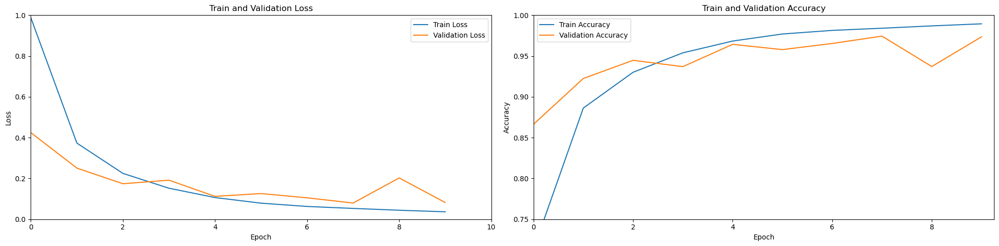

In [24]:
# Eğitim ve doğrulama kayıp ve doğruluğunun grafiğini çizme
plt.figure(figsize=(20, 5))

# Eğitim ve doğrulama kaybı için alt grafik
plt.subplot(1, 2, 1)
plt.title("Train and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Validation Loss")
plt.xlim(0, 10)
plt.ylim(0.0, 1.0)
plt.legend()

# Eğitim ve doğrulama doğruluğuna yönelik alt grafik
plt.subplot(1, 2, 2)
plt.title("Train and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(history.history['accuracy'], label="Train Accuracy")
plt.plot(history.history['val_accuracy'], label="Validation Accuracy")
plt.xlim(0, 9.25)
plt.ylim(0.75, 1.0)
plt.legend()

plt.tight_layout()

In [25]:
# Doğrulama Verileri için Etiketleri ve Tahminleri Alma ve Düzleştirme
import tensorflow as tf
import itertools

# Etiketleri ve tahminleri depolamak için listeleri başlatma
labels = []
predictions = []

# Etiketleri ve tahminleri almak için doğrulama oluşturucuyu yineleme
for x, y in valid_gen:
    labels.append(list(y.numpy()))# Doğru etiketleri ekleme
    predictions.append(tf.argmax(model.predict(x), 1).numpy())# Tahmin edilen etiketleri ekleme

# Liste listelerini düzleştir
predictions = list(itertools.chain.from_iterable(predictions))
labels = list(itertools.chain.from_iterable(labels))

1/1 [==============================] - 0s 211ms/step


In [26]:
# Modelin performansına göre değerlendirme metriklerini yazdırma
# Hepsi 100 ile çarpılır ve iki ondalık basamağa göre biçimlendirilir.

# Train Accuracy: Eğitim geçmişinden son kaydedilen eğitim doğruluğunu alır
print("Train Accuracy: {:.2f} %".format(history.history['accuracy'][-1]*100))

# Test Accuracy: Gerçek etiketleri tahmin edilen etiketlerle karşılaştırarak doğruluk puanını hesaplar
print("Test Accuracy: {:.2f} %".format(accuracy_score(labels, predictions) * 100))

#Precision Score: Mikro ortalama stratejisini kullanarak kesinlik puanını hesaplar.
print("Precision Score: {:.2f} %".format(precision_score(labels, predictions, average='micro') * 100))

#Recall Score: mikro ortalama stratejisini kullanarak hatırlama puanını hesaplar
print("Recall Score: {:.2f} %".format(recall_score(labels, predictions, average='micro') * 100))


Train Accuracy: 98.95 %
Test Accuracy: 97.35 %
Precision Score: 97.35 %
Recall Score: 97.35 %


<Figure size 2000x500 with 0 Axes>

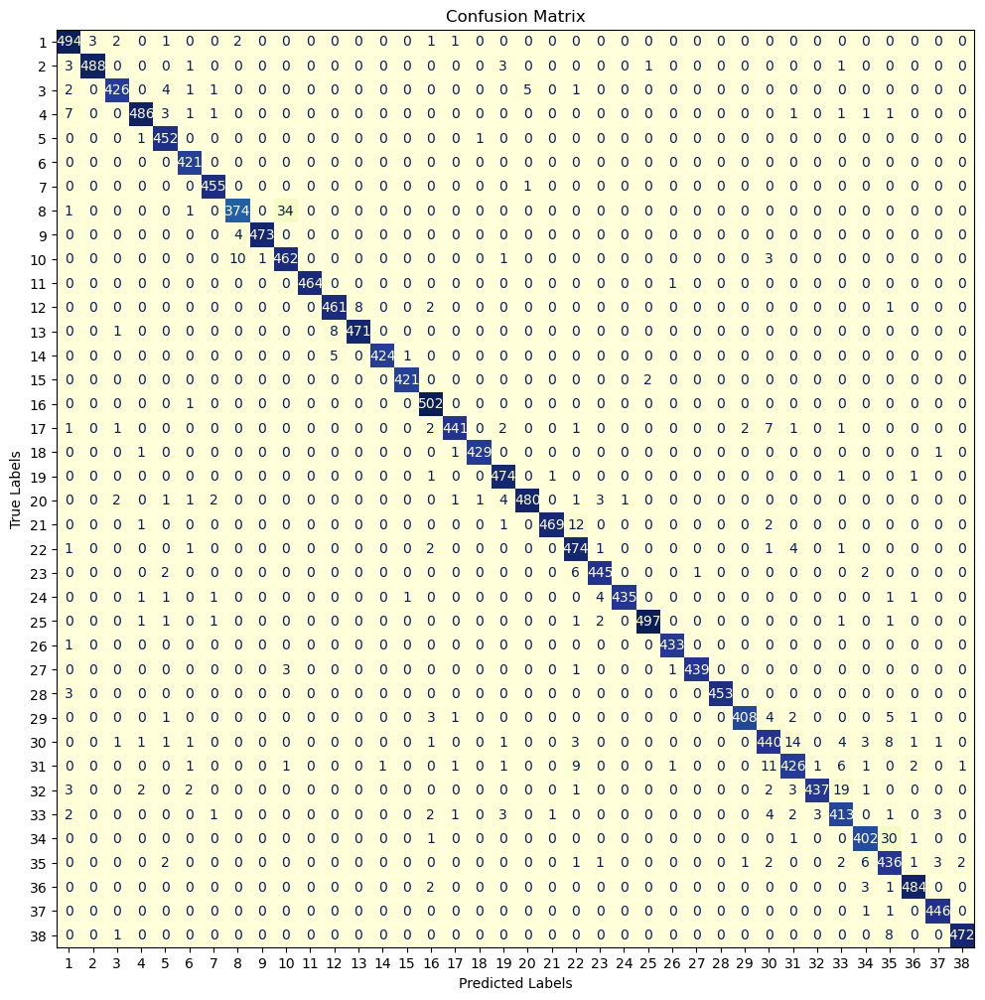

In [27]:
# Gerçek etiketlere ve tahmin edilen etiketlere dayalı bir karışıklık matrisi çizin
plt.figure(figsize= (20,5))
cm = confusion_matrix(labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(range(1,39)))
fig, ax = plt.subplots(figsize=(12,12))
disp.plot(ax=ax,colorbar= False,cmap = 'YlGnBu')
plt.title("Confusion Matrix")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [29]:
# Görseli hazırlama ve model tarafından tahmin edilmeye hazır hale getirme

# Görüntüyü yükleyin ve önişleyin
from tensorflow.keras.preprocessing import image
img_path = "C:/Users/Bilgehan/Desktop/Sema Tosun/domates_bakteriyel_benek.jpg"
img = image.load_img(img_path, target_size=(256,256))
img_array = image.img_to_array(img)
img_array = img_array.astype("float32") / 255.0 
img_array = tf.expand_dims(img_array, 0)

Text(0.5, 0.98, '(224, 224, 3)')

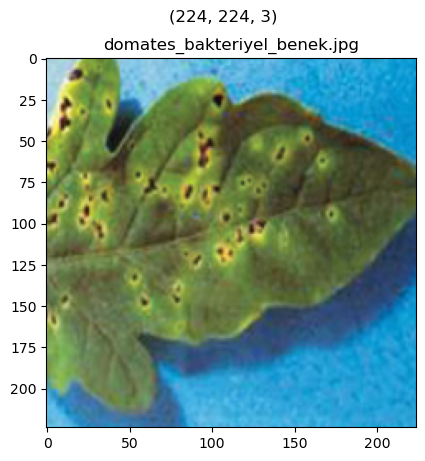

In [35]:
# load_prep işlevini kullanarak görüntünüzü görselleştirin
def load_prep(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img)
    img = tf.image.resize(img, size=(224,224))
    return img

# Görüntüyü yükleyin ve önişleyin
image = load_prep(img_path)

# Önceden işlenmiş görüntüyü görselleştirin
plt.imshow(image/255.)
plt.title('domates_bakteriyel_benek.jpg')
plt.suptitle(image.shape)

In [31]:
predictions = model.predict(img_array)
predictions

1/1 [==============================] - 0s 72ms/step


array([[2.9097933e-05, 2.2773575e-10, 3.3579526e-09, 5.0008947e-12,
        1.6490658e-09, 4.7898266e-07, 5.6335206e-12, 7.0285829e-08,
        4.0083659e-08, 1.4837659e-10, 3.0899074e-08, 8.3067646e-13,
        1.5482633e-11, 5.0569488e-12, 1.4327844e-14, 5.8604406e-11,
        6.3202516e-12, 1.8854938e-11, 2.4688101e-05, 1.5005623e-11,
        6.3126936e-04, 6.8990294e-16, 2.8205008e-12, 1.8045737e-11,
        4.1785567e-15, 7.1682826e-14, 9.6496130e-08, 1.1526309e-09,
        5.7530608e-13, 3.4983660e-08, 1.3799863e-10, 9.9931347e-01,
        1.0871558e-07, 4.0224088e-13, 6.5617942e-14, 1.2487716e-11,
        2.0869887e-14, 5.9229041e-07]], dtype=float32)

In [32]:
predicted_class = np.argmax(predictions)
print(f"this image : Predicted Class: {predicted_class}, Class name: {class_names[predicted_class]}")

this image : Predicted Class: 31, Class name: Tomato___Leaf_Mold


In [36]:
from tensorflow.keras.models import load_model
model.save('model.h5')
